In [54]:
import matplotlib.pyplot as plt # plt 用于显示图片
import matplotlib.image as mpimg # mpimg 用于读取图片
import numpy as np
from PIL import Image
import os 
import skimage.io as io
#read imgaes
os.chdir("/Users/nizheng/Desktop/mias-mammography/all-mias/")
str=os.getcwd() + '/*.pgm'
coll = io.ImageCollection(str)
print(len(coll))
coll = np.array(coll).astype(np.int16)
for k in range(0,322,2):    
    for i in range(0,1024):
        for j in range(0,512):
            u = coll[k,i,j]
            coll[k,i,j] = coll[k,i,1023-j]
            coll[k,i,1023-j] = u


322


In [56]:
#make the border clear. clean the noise
backup=coll
coll[coll<40]=0
np.min(coll[coll>0])

40

In [50]:
def clear(lenaaa):
    m = 0
    n = 0
    for i in range(0,512):
        for j in range(0,1024):
            if lenaaa[i,j]!=0:
                m = j
                break
        for j in range(m+10,1023):
            if lenaaa[i,j]==0:
                n = j
                break
        for j in range(n,1024):
            lenaaa[i,j] = 0
    print(m)
    print(n)
    return lenaaa


In [57]:
def clear2(lenaaa):
    m = 0
    n = 0
    for i in range(0,1024):
        for j in range(512,1024):
            if lenaaa[i,j]==0:
                lenaaa[i,j:1024]=0
    return lenaaa


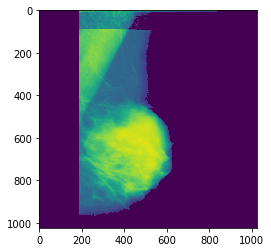

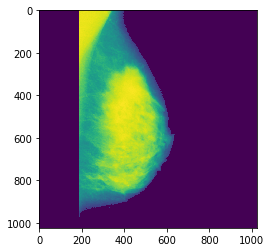

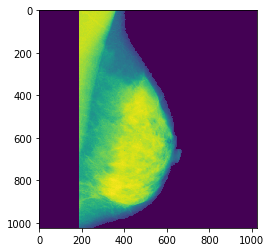

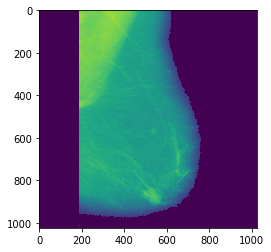

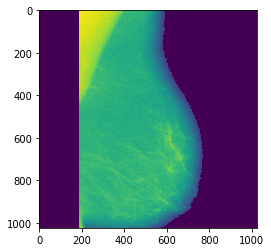

...

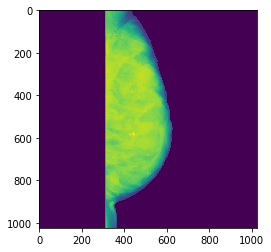

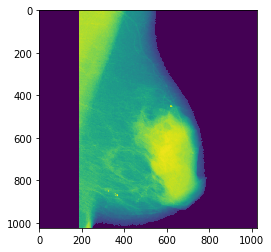

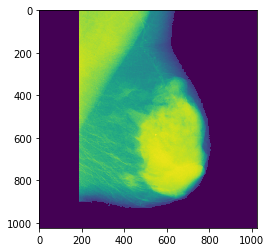

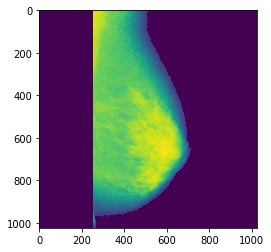

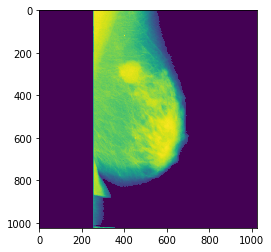

In [60]:
for i in range(0,322):
    coll[i] = clear2(coll[i])
    plt.imshow(coll[i]) # 显示图片
    plt.show()

In [59]:
#special cases
coll[279,960:1024,0:1024] = np.zeros((64,1024))
coll[279,400:1024,790:1024] = np.zeros((1,1))
coll[279,880:1000,500:600] = np.zeros((1,1))
coll[273,960:1024,0:1024] = np.zeros((64,1024))
coll[273,400:1024,790:1024] = np.zeros((1,1))
coll[273,900:1000,600:700] = np.zeros((1,1))

In [270]:
lenaaa = coll[195]

for i in range(0,1024):
    n=1023
    for j in range(0,1024):
        if lenaaa[i,j]!=0:
            m = j
            break
    for j in range(m+10,1023):
        if lenaaa[i,j+1]-lenaaa[i,j]>70:
            n = j
            break
    for j in range(n,1024):
        lenaaa[i,j] = 0
